## Assignment 2 for EE5731 AY2023/2024 Semester 2
### Exploring Optical Flow Estimation from Dark Videos (100)

#### Background
Let us build upon our exploration over dark images and extend it towards the exploration of dark videos. Particularly, we explore the optical flow estimated from these dark videos.

#### Requirements
In this assignment, you are to complete several (sub)-tasks that explores 1) the estimation of optical flow in dark videos with Lucas-Kanade and Horn-Schunck algorithms; 2) the effects of image enhancement over the results of optical flow estimation; and 3) what information could be obtained via the optical flow estimated.

Before doing the project, please read the instructions carefully (failure to follow them may result in unnecessary penalty):

1. Implement your codes with the code block in jupyter notebook, you may add in however much code blocks you require. TODO code blocks are added as placeholders. **DO NOT** modify the instructional markdown blocks;
2. Make sure your codes **clean**, **easily readable** (add meaningful comments if needed, comments are **markable**);
3. Make sure that the **submitted notebooks have been run** and the **cell outputs are clearly visible**.
4. Write your answers in the given markdown cells (with [**Fill in xxxx**]), keep your answers clear and concise;
5. Your submission should be the exported PDF file of your jupyter notebook. It is easier for you to **"Export to HTML"** first, then **Print to PDF**. Please print your PDF strictly in **Portrait** mode. Name your PDF file to **"MATRICULATION NUMBER_YOUR NAME_CA2.pdf"**
6. Incorrect submission format will result in a **direct** 20 points (out of 100) deduction.
6. Do submit your project on [Canvas](https://canvas.nus.edu.sg/) before the deadline: **5:59 pm (SGT), 11 November, 2024**; 
7. Policy on late submission: the deadline is a strict one, so please prepare and plan early and carefully. Any late submission will be deducted 10 points (out of 100) for every 24 hours.
8. This is an individual project, do **NOT** share your solutions with others, we have zero tolerance for **plagiarism**.

#### Before the Task
- For the following task, you are to use [Walk.mp4](https://canvas.nus.edu.sg/files/5168966/download?download_frd=1) and [Run.mp4](https://canvas.nus.edu.sg/files/5168967/download?download_frd=1).
- **IMPORTANT!** You may use any function of OpenCV or its equivalence for basic operations (e.g., loading images, matrix computation, etc.), but **strictly NOT** the direct functions for each individual task/step (e.g., cv2.calcOpticalFlowPyrLK or its equivalence for Lucas-Kanade OF, and opticalFlowHS in MatLab for Horn-Schunck OF or its equivalence), **unless specified in the steps/instruction** . Using such functions without permission in that step/instruction would be considered erroneous. Other suggested opencv functions will be mentioned for some parts of the task. 

#### Task: Optical Flow Estimation for Ultra-dark Videos (100%)
In this task, you will estimate the optical flow in dark videos with Lucas-Kanade and Horn-Schunck algorithms (from scratch), and explore the effects of image enhancement over the results of optical flow estimation. You shall further analyze what information could be obtained via the optical flow estimated. You are to follow the following steps (requirements):

##### Detailed Steps/Requirements for the Task:
1. Estimate the optical flow of Walk.mp4 with both Lucas-Kanade and Horn-Schunck algorithms. Both algorithm must be implemented **from scratch**. You should plot out the optical flow estimated with respect to the key points (corner points). You may use the OpenCV function of cv2.goodFeaturesToTrack() or the detectMinEigenFeatures function in MatLab to find the key points directly. You may set the **maximum number** of keypoints to be 10. Show your codes in detail with comment as well as your results. Compare the results of both algorithms and analyze their similarity and differences. (30%)
2. You may brighten up the video yourself (using any tool available to you such as those included in your media players) and observe the video. Discuss if the optical flow estimated in Step 1 matches to that you observed manually. If yes, what do you think contributes to the correct estimation, if not, analyze the possible reasons of the mismatch. (20%)
3. Now, implement any enhancement methods of your choice (please specify which enhancement you choose), and apply it to Walk.mp4. Note that the enhancement method should also be implemented from scratch (thus functions such as cv2.cv2.equalizeHist is **NOT Allowed**). Show your results with 4 sampled frames. Then, re-estimate the optical flow of the enhanced video and show your results. Compare the results with what you obtained in Step 1 and analyze why the result has changed / not changed. (20%)
4. Further, estimate the optical flows (both Lucas-Kanade and Horn-Schunck) for Run.mp4 using your implemented code. Show your result and compare them with what you obtained in Step 1 from Walk.mp4. What can you obtain by observing the similarity and differences from the optical estimated from the two videos. Further conclude what kind of information can be obtained from estimating optical flow of videos. (20%)
5. Lastly, estimate the optical flow using OpenCV's function cv2.calcOpticalFlowPyrLK() directly on Walk.mp4. Show and compare the result with your implementation in Step 1. If there are discrepancies, analyze possible reasons of the discrepancies, if they are very similar, suggest what is the key to estimate rather accurate optical flow. (10%)

##### **Step 1: Estimate the optical flow of Walk.mp4**
**1. Lucas-Kanade optical flow:**<br>
The Lucas-Kanade method assumes that the intensity remains constance betweeen two frame, the motion between frames is small, and the pixels in a small neighborhood around a point have similar motions.<br>
**Brightness Constancy**: The intensity of a given point doesn't change in the next frame. $$I(x, y, t) = I(x + \Delta x, y + \Delta y, t + \Delta t)$$ <br>
**Small Motion**: The displacement of a point between two consecutive frame is assumed to be small, therefore, we can approximate the brightness constancy constraint with a Tylor series expansion.
$$ I(x + u, y + v, t + 1) \approx I(x, y, t) + u \frac{\partial I}{\partial x} + v \frac{\partial I}{\partial y} + \frac{\partial I}{\partial t} $$
Combined with *brightness constancy*, we have: $𝐼_𝑥 𝑢 + 𝐼_𝑦 𝑣 + 𝐼_𝑡 = 0$<br>
**Spatial Coherence**: Assume the pixel’s neighbors have the same (𝑢, 𝑣), 𝑢 and 𝑣 are the horizontal and vertical flow components and make the problem solvable in cases where there are fewer constrants than unknowns.<br>
**Solution with Least Squares:**
1. Compute image gradients $I_x$, $I_y$, and temporal gradient $I_t$ between consecutive frames.
2. For each pixel, consider a window (e.g., 5x5) around the pixel.
3. Solve the equation $Ad=b$ for 𝑢 and 𝑣:
$$
\begin{bmatrix}
I_x(p_1) & I_y(p_1) \\ 
...    &   ...   \\
I_x(p_{25}) & I_y(p_{25})
\end{bmatrix}
\begin{bmatrix}
u \\
v
\end{bmatrix}
=-
\begin{bmatrix}
I_t(p_1)\\
...    \\
I_t(p_{25})
\end{bmatrix}
$$
solve for the flow vector (𝑢, 𝑣) by using least squares:
$$
\begin{bmatrix} u \\ v \end{bmatrix} = (A^T A)^{-1} A^T b
$$ 
In the initial implementation of LK optical flow, I use the first method, and the size of the window is set to 7 by 7 (see `lucas_kanade_optical_flow`).<br>


*This formula can also be expressed in sum over pixels form, which is applied in the second implementation of LK optical flow (see `lucas_pyramidal`):
$$
\sum_{(x,y \in W)}
\begin{bmatrix}
 I_x^2 &  I_x I_y \\
 I_x I_y &  I_y^2
\end{bmatrix}
\begin{bmatrix}
u \\
v
\end{bmatrix}
=
-\sum_{(x,y \in W)}
\begin{bmatrix}
 I_x I_t \\
 I_y I_t
\end{bmatrix}
$$
or $G[u, v]^T=b$,
where $G$ is a 2 by 2 matrix(structure tensor), $b$ is a 2 by 1 vector(image mismatch vector).
to find the optical flow $(u, v)$, we compute:
$$
\begin{bmatrix} u \\ v \end{bmatrix} = G^{-1} b 
$$
if $G$ is invertible, otherwise we can use pseudoinverse of G to replace $G^{-1}$.


**2. Horn-Schunck optical flow:**<br>
Horn-Schunck OF adds a **smoothness constraint** to enforce that flow vectors vary smoothly by minimizing a function that balances brightness constancy and smoothness.<br>
**Motion smoothness**: Assume most objects in the world are rigid/deform elastically, move together coherently.
$$\min_{u,v}\sum_{i,j}(E_s(i, j)+\lambda E_d(i, j))$$
In the cost function, 
$$
E_d(i, j) = (I_x u + I_y v + I_t)^2 
$$
$E_d(i, j)$ represents the brightness constancy assumption.
$$
E_s(i, j) = \frac{1}{4}[(u_{i,j}−u_{i+1,j})^2+(u_{i,j}− u_{i,j+1})^2+(u_{i,j}− u_{i+1,j})^2+(u_{i,j}− u_{i+1,j})^2]
$$
$E_s(i, j)$ represents the smoothness constraint, penalizing large changes in the optical flow vector $(u,v)$ between neighboring pixels. It assumes that adjacent pixels share similar motion, leading to a more coherent flow field. It introduces a global constraint of smoothness to solve the aperture problem. So Horn-Schunck method operates as a global optimization approach, whereas the Lucas-Kanade method focuses more on local regions.
$\lambda$, which is also known as the ‘regularizer’, is basically a weighting factor that decides how much importance needs to be given to either of the two constraints: the Brightness Constraint and the Smoothness Constraint, respectively. So, if $\lambda $ has a small value, we need to put more weight on the smoothness constraint to get something very smooth and thereby, get a constant flow vector. This will result in every pixel moving exactly in the same direction and at the same speed.

To increase the weight of the smoothness assumption, I set the reciprocal of the $\lambda$ to 0.1. The number of iterations is set to 70 (see `horn_schunck_optical_flow`).


**Solution with gradient decent method:**
1. Compute image gradients $I_x$, $I_y$, and $I_t$.
2. Initialize flow fields 𝑢 and 𝑣 to zero.
3. Iteratively update 𝑢 and 𝑣 based on the following equations:
$$
u_{i,j} = \bar{u}_{i,j} - \frac{I_x \bar{u}_{i,j} + I_y \bar{v}_{i,j} + I_t}{\lambda^{-1} + I_x^2 + I_y^2}I_x
$$
$$
v_{i,j} = \bar{v}_{i,j} - \frac{I_x \bar{u}_{i,j} + I_y \bar{v}_{i,j} + I_t}{\lambda^{-1} + I_x^2 + I_y^2}I_y
$$
where $\bar{u}_{i,j}$ and $\bar{v}_{i,j}$ are the local averages.<br>
$$
\bar{u}_{i,j} = \frac{u_{i-1,j} + u_{i+1,j} + u_{i,j-1} + u_{i,j+1}}{4}
$$
$$
\bar{v}_{i,j} = \frac{v_{i-1,j} + v_{i+1,j} + v_{i,j-1} + v_{i,j+1}}{4}
$$
4. Repeat the updates for a set number of iterations or until the values converge.


**3. Implementation**<br>
&emsp;&emsp;In the implementation of optical flow detection, I set the maximum number of corner points to 20 and used **cv2.goodFeaturesToTrack** to locate the corners $p(x_0, y_0)$  in the first frame. The **Lucas-Kanade (LK)** and **Horn-Schunck (HS)** methods were then used to compute the corresponding optical flow vectors $(u, v)$. <br>
&emsp;&emsp;The points $q$ from the current frame were then set as the starting points $p$ for the next frame, and the current frame became the reference frame for the following calculation. <br>
&emsp;&emsp;Since some points in the 1st frame may not have corresponding flow vectors, these are **“lost”** features, resulting in a gradual reduction of trackable points. To maintain robust tracking, I set a condition to re-detect key points whenever the number of key points falls below a **minimum threshold** or if the **success rate** of the previous optical flow computation is less than 80%. When the condition is true, **cv2.goodFeaturesToTrack** is used again to locate additional corners.

&emsp;&emsp;For each detected corner, the <u>corresponding point</u> in the second frame, $q(x_0 + u, y_0 + v)$ was marked with a <u>large point (radius=5)</u>, and the <u>**flow vector**</u> was indicated by a <u>**line** (thickness = 2)</u> of the same color. I use a mask image to store all the optical flow vectors and add it to the final frame. <br>

In [2]:
# step1: Optical Flow of Walk.mp4
#############################################################################
##                                                                         ##
##           TODO: CODE BLOCK FOR STEP 1 IS HERE                           ##
#############################################################################
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import cv2
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
#############################################################################
# Implement the optical flow estimation algorithm from scratch (both LK and HS)

# Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
# Ky = Kx.T

# Define kernels for gradient computing
Kx = np.array([[-1, 1], [-1, 1]], np.float32)
Ky = Kx.T
Kt = np.array([[-1, -1], [-1, -1]], np.float32)
Kt_J = -Kt

# Gradient calculation
def compute_gradients(img1, img2):
    I_ = img1.astype(np.float32)
    J_ = img2.astype(np.float32)
    Ix = signal.convolve2d(I_, Kx, boundary='symm', mode = 'same')# Gradient in x direction
    Iy = signal.convolve2d(I_, Ky, boundary='symm', mode = 'same')# Gradient in y direction
    
    # It = J_-I_ 
    I_t = signal.convolve2d(I_, Kt, boundary='symm', mode = 'same')
    J_t = signal.convolve2d(J_, Kt_J, boundary='symm', mode = 'same')
    It = J_t+I_t   # Temporal gradient
    
    return Ix, Iy, It

def lucas_kanade_optical_flow(img1, img2, keypoints, half_window=3):
    # compute the image gradients
    I_x, I_y, I_t = compute_gradients(img1, img2)
    flow_vectors = [] # Flow vector(u, v)

    for point in keypoints:
        x, y = int(point[0][0]), int(point[0][1])
        # key points must not fall outside of the image I
        if 0 <= x < img1.shape[1] and 0 <= y < img1.shape[0]: 
            # Extract gradients within the window
            Ix = I_x[y-half_window:y+half_window+1, x-half_window:x+half_window+1].flatten()
            Iy = I_y[y-half_window:y+half_window+1, x-half_window:x+half_window+1].flatten()
            It = I_t[y-half_window:y+half_window+1, x-half_window:x+half_window+1].flatten()
            # Construct matrice A and b and solve for optical flow vector:
            A = np.vstack((Ix, Iy)).T
            b = -It.reshape(-1, 1)
            # Solve for (u, v) using least squares
            nu = np.linalg.pinv(A.T @ A) @ A.T @ b  # Use pseudo-inverse

            # key points must not fall outside of the image J
            if 0 <= x+nu[0] < img1.shape[1] and 0 <= y+nu[1] < img1.shape[0]:
                flow_vectors.append((x, y, nu[0][0], nu[1][0]))
        else:
            print(f"Warning: Keypoint ({x}, {y}) falls out of image and will be skipped.")    
    return flow_vectors

def four_neighbor_avg(matrix):
    # Compute the average of the four immediate neighbors (top, bottom, left, right)
    # up = np.roll(matrix, -1, axis=0)
    # right = np.roll(matrix, 1, axis=1)
    # down = np.roll(matrix, 1, axis=0)
    # left = np.roll(matrix, -1, axis=1)
    # avg_4 = (up + down + left + right) / 4.0

    # using Laplacian kernel to compute average
    K = np.array([[1/12, 1/6, 1/12], [1/6, 0, 1/6], [1/12, 1/6, 1/12]], np.float32) #Laplacian kernel
    avg = signal.convolve2d(matrix, K, boundary='symm', mode = 'same')
    return avg

def horn_schunck_optical_flow(img1, img2, keypoints, alpha=1.0, num_iterations=200, delta = 1e-3):
    # compute the image gradients
    I_x, I_y, I_t = compute_gradients(img1, img2)
    flow_vectors = [] # Flow vector(u, v)

    # Initialize u and v
    u = np.zeros(img1.shape)
    v = np.zeros(img1.shape)

    for iter_counter in range(num_iterations):
        # Compute local averages of u and v
        u_avg = four_neighbor_avg(u)
        v_avg = four_neighbor_avg(v)
        # Update u and v using gradient descent method
        denominator = alpha + I_x**2 + I_y**2
        numerator = I_x * u_avg + I_y * v_avg + I_t
        prev_u = u

        u = u_avg - I_x * numerator / denominator
        v = v_avg - I_y * numerator / denominator

        diff = np.linalg.norm(u - prev_u, 2)
        #converges check
        if  diff < delta:
            # print("iteration number: ", iter_counter)
            break

    # Extract flow at the specified keypoints
    flow_vectors = []
    for point in keypoints:
        x, y = int(point[0][0]), int(point[0][1])
        # key points must not fall outside of the image
        if 0 < x < img1.shape[1]-1 and 0 < y < img1.shape[0]-1 and 0 < (x+u[y, x]) < img1.shape[1]-1 and 0 < (y+v[y, x]) < img1.shape[0]-1:
            flow_vectors.append((x, y, u[y, x], v[y, x]))
        else:
            print(f"Warning: Keypoint ({x}, {y}) falls out of image and will be skipped")
    return flow_vectors

##############################################################################################
# Enhancement method for step3

# Gamma correction
def gammaCorrection(img_original, gamma):
    # Create the lookup table manually
    lookUpTable = np.array([np.clip((i / 255.0) ** gamma * 255.0, 0, 255) for i in range(256)], dtype=np.uint8)

    # Apply the lookup table to each pixel in the image manually
    if len(img_original.shape) == 3:  # Color image
        result = np.dstack([lookUpTable[channel] for channel in cv2.split(img_original)])
    else:  # Grayscale image
        result = lookUpTable[img_original]
    return result

# Define the process of enhancement
def enhanceSingleFrame(img_dark_, gamma = 0.3):
    output = gammaCorrection(img_dark_, gamma)
    return output

############################################################################################
# Process video and apply optical flow algorithm
def compute_optical_flow(video_path, method=0, enhancement=0, showcase=0, max_corners = 10, quality_level=0.3, min_distance=7):
    # Parameters for goodFeaturesToTrack (to detect keypoints)
    feature_params = dict(maxCorners=max_corners, qualityLevel=quality_level, minDistance=min_distance, blockSize=7)

    gamma = 0.45 # for enhancement

    min_points_threshold = 8 # Minimal number of keypoints
    last_q_num = 0; last_p_num = 0; tracking_ratio_threshold = 0.8 # Minimal tracking ratio

    method_title = "LK"
    enhance_title = " (Dark)"

    # Open the video
    cap = cv2.VideoCapture(video_path)
    
    # Read the first frame
    ret, frame1 = cap.read()
    if not ret:
        print("Failed to read the video")
        cap.release()
        return
    
    # save the final result image
    save_fig = np.zeros_like(frame1, dtype=None, order='K', subok=True, shape=None)
    
    if(enhancement==1):
        # Enhancement applied to single frame
        frame1_enhance = enhanceSingleFrame(frame1, gamma)
        # Convert to grayscale
        prev_gray = cv2.cvtColor(frame1_enhance, cv2.COLOR_BGR2GRAY)
        enhance_title = "(with enhancement)"
        
        if(showcase==1):
            # parameters for capturing enhancement frames
            captured_frames = [] # array to store 
            total_frame = 4
            frame_interval = 30
            frame_count = 0
    else:
        # Convert to grayscale
        prev_gray = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)

    # Detect key points in the first frame
    p0 = cv2.goodFeaturesToTrack(prev_gray, mask=None, **feature_params) # p0(x,y)

    # Create a mask image for drawing purposes
    mask = np.zeros_like(frame1)
    # Create some random colors
    color = np.random.randint(0, 255, (100, 3))

    while cap.isOpened():
        # Read the next frame
        ret, frame2 = cap.read()
        if not ret:
            break
        
        if(enhancement==1):
            # Enhancement applied to single frame
            frame2_enhance = enhanceSingleFrame(frame2, gamma)
            # Convert to grayscale
            gray = cv2.cvtColor(frame2_enhance, cv2.COLOR_BGR2GRAY)

            if showcase ==1:
                if(len(captured_frames)< total_frame):
                    if frame_count % frame_interval == 0:
                        captured_frames.append(frame2_enhance)
                frame_count += 1
        else:
            # Convert to grayscale
            gray = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

        # Check the number of key points, and if the number is insufficient, re-detect new key points
        if (len(p0) < min_points_threshold) or ((last_q_num<tracking_ratio_threshold*(last_p_num)) and last_p_num!=0):
            p0 = cv2.goodFeaturesToTrack(prev_gray, mask=None, **feature_params)

        # Calculate optical flow
        if(method == 0):
            # Option 1: Lucas-Kanade
            flow_vectors = lucas_kanade_optical_flow(prev_gray, gray, p0, half_window=3)
        else:
            # Option 2: Horn-Schunck
            flow_vectors = horn_schunck_optical_flow(prev_gray, gray, p0, alpha=10.0, num_iterations=70, delta=1e-1)
            method_title = "HS"

        # record the tracking ratio
        last_p_num = len(p0)
        last_q_num = len(flow_vectors)

        # Draw the tracks
        if(enhancement==1):
            show_img = frame2_enhance.copy() # show the enhancement result
        else:
            show_img = frame2.copy()
        
        for i, (x, y, u, v) in enumerate(flow_vectors):
            # The norm of optical flow should not be large
            # len_of = np.linalg.norm([u, v])
            # if (len_of>20.0):
            #     continue

            # Draw an arrow from the original point to the new location
            start_point = (int(round(x)), int(round(y)))
            end_point = (int(round(x+u)), int(round(y+v)))
            mask = cv2.line(mask, start_point, end_point, color[i].tolist(), 2)  
            show_img = cv2.circle(show_img, end_point, 5, color[i].tolist(), -1)

        output = cv2.add(show_img, mask)
        cv2.imshow(video_path + enhance_title + " - " + method_title, output)

        # Update the previous frame and the coordinates of the keypoint
        prev_gray = gray.copy()
        p0 = np.array([[x + u, y + v]], dtype=np.float32)

        # update the figure
        save_fig = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        
        # Exit if 'q' is pressed
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break

    cap.release()
    cv2.destroyAllWindows()

    if showcase==1:
        if len(captured_frames)<total_frame:
            print("Not enough frames to capture")
        else:
            # show 4 frames
            fixed_width = 8
            height, width, channel = frame1.shape
            aspect_ratio = height / width 
            fig_height = (fixed_width * aspect_ratio)
            fig, ax = plt.subplots(2, 2, figsize=(fixed_width, fig_height))
            fig.suptitle('Enhancement (4 sampled frames)', size = 12)
            ax[0,0].imshow(cv2.cvtColor(captured_frames[0], cv2.COLOR_BGR2RGB)),ax[0,0].set_title('1st')
            ax[0,1].imshow(cv2.cvtColor(captured_frames[1], cv2.COLOR_BGR2RGB)),ax[0,1].set_title('2nd')
            ax[1,0].imshow(cv2.cvtColor(captured_frames[2], cv2.COLOR_BGR2RGB)),ax[1,0].set_title('3rd')
            ax[1,1].imshow(cv2.cvtColor(captured_frames[3], cv2.COLOR_BGR2RGB)),ax[1,1].set_title('4th')
            for i in range(ax.shape[0]):
                for j in range(ax.shape[1]):
                    ax[i,j].set_xticks([])
                    ax[i,j].set_yticks([])
            plt.tight_layout()
            plt.show()
            plt.close(fig)

    # show all the result in notebook
    fig = plt.figure()
    plt.imshow(save_fig)
    plt.axis('off')
    plt.title(video_path + enhance_title + " - " + method_title)
    plt.show()
    plt.close(fig)

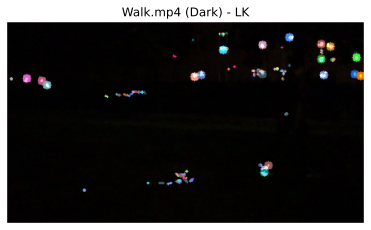

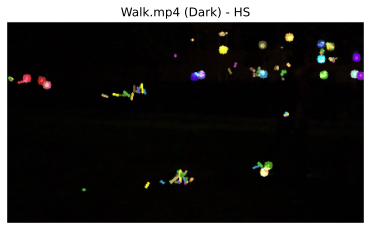

In [84]:
# Run the function
video_name = "Walk.mp4"
compute_optical_flow(video_name,method=0, enhancement=0, showcase=0, max_corners=20, quality_level=0.01,min_distance=7)
compute_optical_flow(video_name,method=1, enhancement=0, showcase=0, max_corners=20, quality_level=0.01,min_distance=7)

[**Fill in your discussion to Step 1 here**]

<big>**Compare the results of both algorithms and analyze their similarity and differences:**</big>

**Similarity:**<br>
**1. Location of Flow Vectors:** <br>
Since the same corner detection algorithm (cv2.goodFeaturesToTrack) is used to find keypoints for both the LK and HS methods, the detected optical flow vectors appear at similar positions in both images. In the middle of the images, two horizontal bands of flow vectors are visible, representing the movement of a person’s elbows and feet. Additionally, small flow vectors are detected in the left background, around the windows, and in the upper-right corner near the leaves and windows. These vectors likely result from minor noise or interference, causing slight motions.<br>
**2. Magnitude of Flow Vectors:** <br>
The magnitudes of the flow vectors are generally small in both methods. The flow vectors in the background are expected to be minimal because these points remain stationary. Interestingly, even the flow vectors associated with the moving person are relatively small in the result of LK method. This could be due to the LK method relying on the brightness constancy assumption. In low-light conditions, a person’s movement may cause changes in local illumination around the feature points, especially in a very dark setting where slight brightness variations may not be too smaller than the brightness of keypoints to be detected. Although HS incorporates a smoothness constraint for the flow field, the difficulty of maintaining even brightness in such a dark environment may reduce its effectiveness, resulting in only marginal improvements over LK.<br>
**3. Discontinuity of Flow Vectors:** <br>
The flow vectors on the moving person are discontinuous, likely due to the challenges posed by low-light conditions. As previously discussed, both the brightness constancy and flow field smoothness assumptions are difficult to satisfy under extreme darkness. Besides, the algorithms might struggle to detect sufficient contrast around feature points, which can also explain the instability in tracking. Consequently, feature tracking is highly unstable in these regions, preventing the formation of a continuous flow field around the moving person.<br>

**Differences:**<br>
**1. Density of Flow Vectors:**<br>
The HS method produces a denser flow field, especially noticeable in areas with minimal motion or static backgrounds. This is due to the HS method’s global constraint, which enforces a smooth flow field across the entire image, filling in motion vectors even where there might be minimal changes. In contrast, the LK method tends to be more strict, enforcing the brightness constancy, which is unrealistic, leading to fewer detected vectors.<br>

**2. Smoothness of Flow Patterns:**<br>
The HS method’s regularization term ensures a smoother flow pattern across the entire field. This smoothness is evident in the background areas where slight illumination changes produce continuous flow patterns. In comparison, the LK method shows more isolated points with less overall continuity, as it treats each detected feature point independently without enforcing global smoothness.<br>

**3. Sensitivity to Noise:**<br>
In dark environments, noise becomes more prominent. The HS method, with its global approach, is more susceptible to picking up noise in darker regions and interpreting it as small motion vectors. This is why there are more visible but likely erroneous flow vectors in static background areas with HS. The LK method, being a local method, tends to ignore these small variations, resulting in fewer noise-induced vectors in the darker areas.<br>

**4. Impact on Moving Objects:**<br>
The flow vectors on the moving objects (e.g., the person) appear more distinct in the LK method, as it can concentrate on high-contrast areas even in low-light conditions. The HS method, however, slightly smooths out these vectors due to its global constraint, which can dilute the sharpness of motion around the moving subject, blending it with the background motion vectors. 

**Summary:**<br>
In conclusion, the HS method provides a denser and smoother but probably noiser flow field, while LK method yields a more sparse and isolated flow vectors, focusing on reliable feature points and minimizing noise.

##### **Step 2: Compare with the enhanced video**

In [96]:
#############################################################################
##                                                                         ##
##           TODO: CODE BLOCK FOR STEP 2 IS HERE                           ##
#############################################################################
# I use a online video enhancement tool.
# website:https://www.veed.io/zh-CN/tools/video-brightness-editor.

[**Fill in your discussion to Step 2 here**]

<big>**Discussion:**</big>
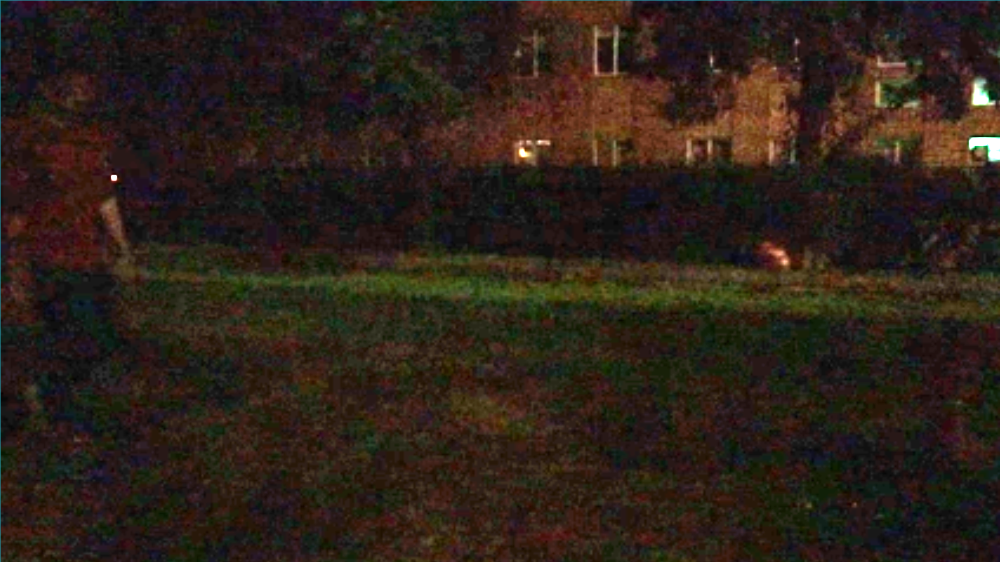
time: 0s
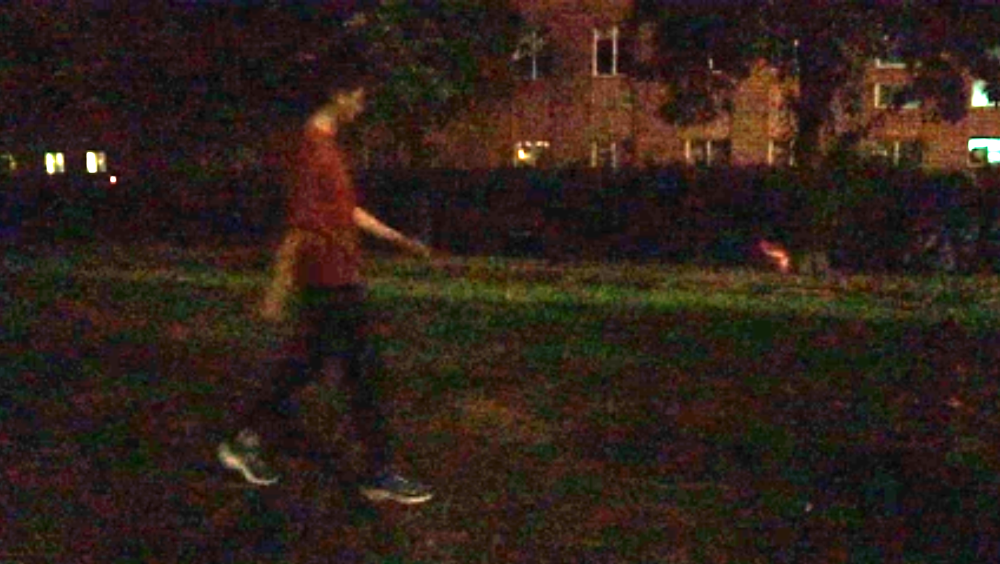
time: 1s
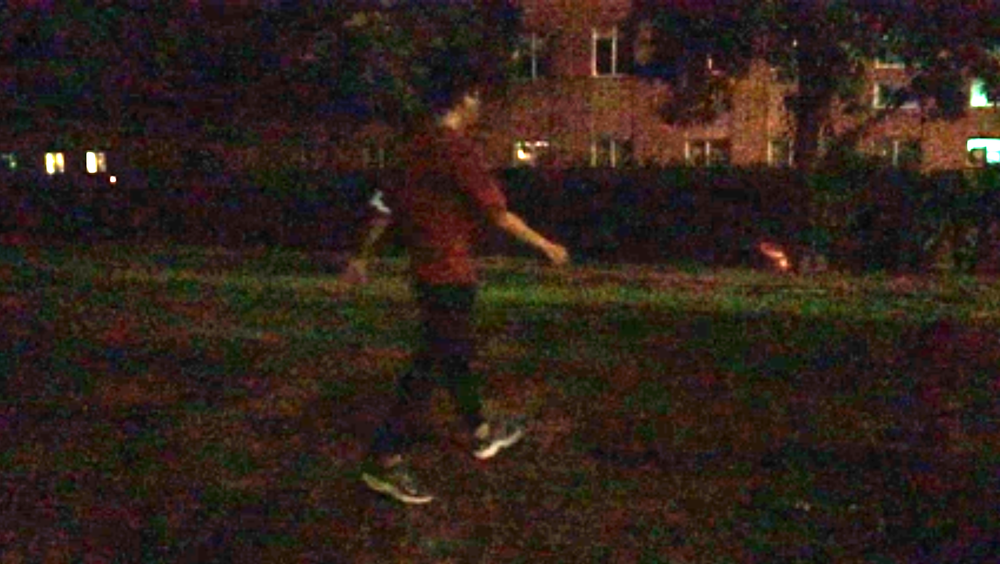
time: about 1.5s
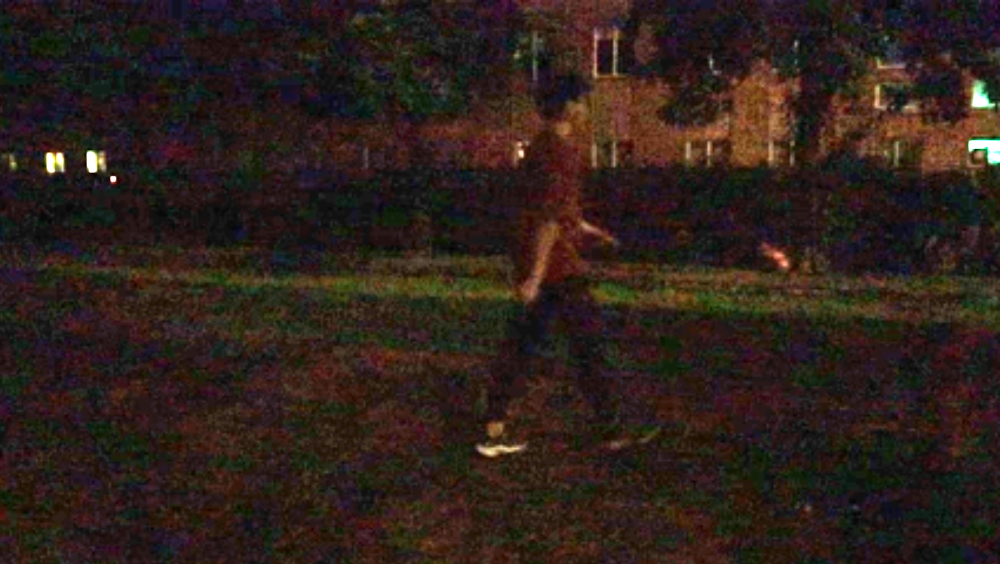
time: 2s
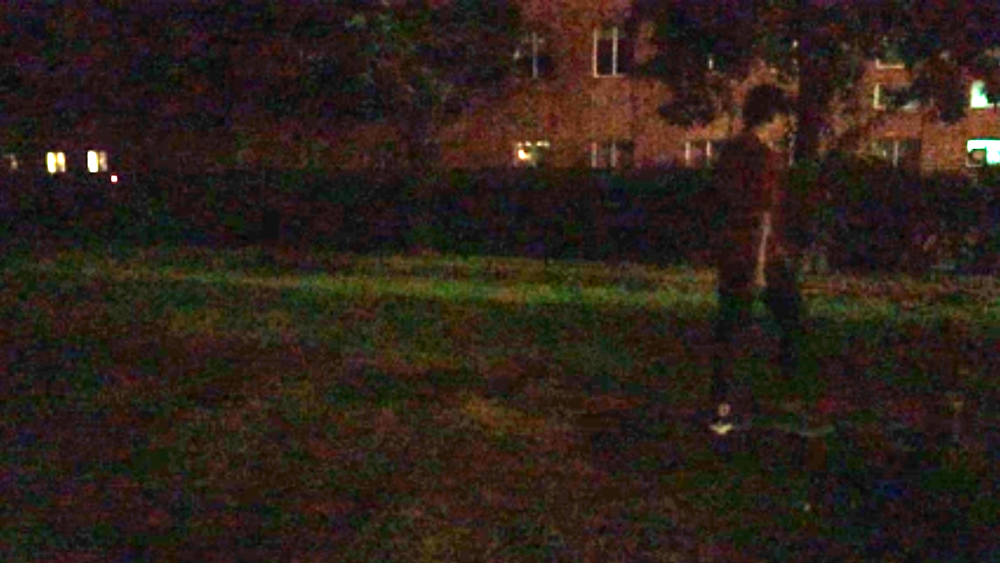
time: 3s

The images above show five key frames extracted from the enhanced video. Let’s recap two **key assumptions** of optical flow estimation:<br>

**1. Small Motion**: The Taylor expansion approximation for optical flow is valid only when the displacement values u and v are small.<br>
**2. Brightness Consistency**: The brightness of key points between consecutive frames should be nearly identical for the optical flow calculation to be accurate.<br>

Looking at the optical flow results from Step 1, a question arises: **why** do we detect the elbow and heel in the around **1~1.5s** but not at other times? Comparing these results with the enhanced video, I found the answer.<br>

In the video, the person initially moves from the far left toward the camera, reaching the center of the frame around 1.5 seconds, and then moves farther to the right, away from the camera. At around 1.5 seconds, the person is **closest** to the camera, making the figure **larger and revealing more details**, with more pronounced movements. As the person moves away from the camera, their figure shrinks, and the **weaker illumination** toward the edges of the frame, along with the **increased noise** in the dark, obscures fine details. Some feature may lost during the tracking and intensity varies, so this environment makes it harder to satisfy the two **key assumptions** for optical flow, leading to incorrect estimations.<br>

The second question is: **why** do we detect the **elbow** and **heel** specifically and not other parts of the person? The detected optical flow corresponds to regions where the person’s left arm swings backward, revealing a **bright patch** at the elbow (likely from a mask or t-shirt design) that **contrasts sharply** with the **dark clothing**. Similarly, there is a **contrasting pattern** at the shoes, where the bright and dark colors meet. The bright color of the object is helpful to maintain brightness constancy, leading to successful optical flow estimation.<br>

The HS method includes a smoothness term in its optimization process, which encourages neighboring pixels to have similar flow vectors. This smoothness constraint should, in theory, result in a more continuous flow field. However, in low-light conditions, as seen in the video, this constraint may amplify noise. The limited illumination reduces contrast, making it harder to distinguish between actual motion and noise. As a result, HS might generate slightly noisier or less accurate flow in darker areas, especially around stationary objects like windows or trees, where the smoothness assumption forces some motion to appear even when there is none.<br>

##### **Step 3: Apply enhancement and optical flow estimation to Walk.mp4**
In this part, I use gamma correction to enhance the video, as it can efficiently adjust brightness levels without requiring much processing time. (Note: the code is shown in **Step 1**)<br>

**Steps for gamma correction:<br>**
(1)Generate a lookup table to map each possible pixel intensity value (0–255) based on the specified gamma value. The table is created by this formula: 
$$ \text{i\_adjusted} = \left(\frac{i}{255.0}\right)^{\gamma} \times 255.0 $$
where $i$ represents intensity level, $\gamma(<1)$ brighten the image. And each value is clipped between 0 and 255.<br>
(2)Apply the lookup table to eachh pixel in the image, for both grayscale image and color image (applying transforming independently to each channel: R, G, B).<br>

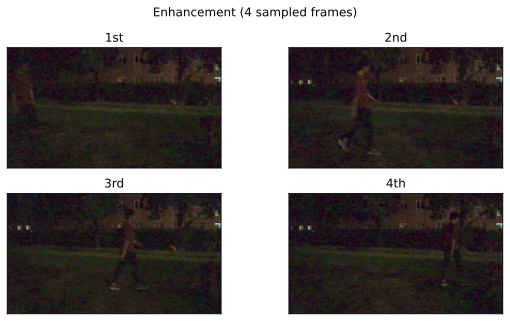

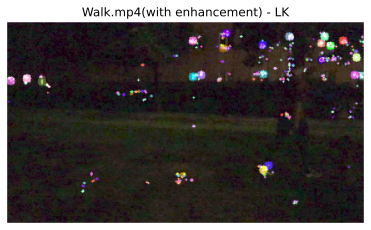

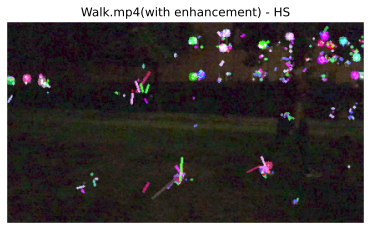

In [102]:
# step3: Enhancement Version
#############################################################################
##                                                                         ##
##           TODO: CODE BLOCK FOR STEP 3 IS HERE                           ##
#############################################################################
# Run the function
video_name = "Walk.mp4"
compute_optical_flow(video_name,0, 1, 1, 20, 0.01, 7)
compute_optical_flow(video_name,1, 1, 0, 20, 0.01, 7)

[**Fill in your discussion to Step 3 here**]

<big>**Compare the results with what you obtained in Step 1 and analyze why the result has changed / not changed:**</big>

Based on the comparison between the results in Step 1 and Step 3, there are noticeable differences. In both the LK and HS methods, the enhanced brightness has resulted in more background optical flow noise, likely due to amplified noise that creates false motion detections. While the brightness enhancement improves the extraction and tracking of features on the person, the overall optical flow results differ between the two methods.<br>

In the LK method, we observe some additional motion traces near the feet on both the left and right sides of the frames, indicating more points were tracked on the moving person. In the LK method, although the optical flow remains somewhat discontinuous, it appears relatively stable and clean. In the HS method, similar additional motion patterns are visible, but the optical flow on the person appears more chaotic compared to the darker video from Step 1. This could be attributed to the amplified noise. In areas of rapid motion or occlusion, the HS method tends to produce less accurate results, as it may oversmooth significant motion changes or fail to capture abrupt variations in optical flow.<br>

##### **Step 4: Estimate the optical flow of Run.mp4**

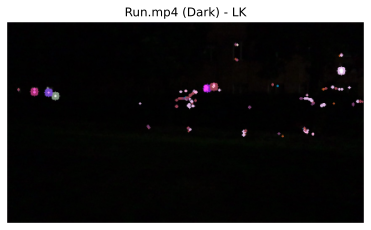

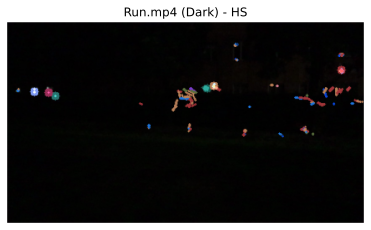

In [ ]:
# Step 4: Estimate the optical flow of Run.mp4
#############################################################################
##                                                                         ##
##           TODO: CODE BLOCK FOR STEP 4 IS HERE                           ##
#############################################################################

video_name = "Run.mp4" 
compute_optical_flow(video_name, 0, 0,0, 20, 0.01, 7)#LK
compute_optical_flow(video_name, 1, 0,0, 20, 0.01, 7)#HS

[**Fill in your discussion to Step 4 here**]

<big>**Discussion on the results of different motion states:**</big><br>

**1. LK method:**<br>
Based on the optical flow analysis of the running video (Run.mp4) using the Lucas-Kanade (LK) method, several observations can be made:

**Similarity to Walk.mp4:** Similar to the walking video, the running video shows small segments of optical flow detected at parts of the body such as the arms and legs. The flow vectors are still discontinuous and sparse.

**Differences from Walk.mp4:** A notable difference is that the optical flow around the feet is more scattered and sparse compared to the walk video. The arm swing motion is also detected, though the flow appears less frequent. Additionally, new areas, such as the head and shoulders, show detected optical flow, which was not as prominent in the walking sequence. 

The LK method tends to produce flow vectors around more stable parts of the body, such as the head and shoulders, with fewer detections at highly dynamic areas like hands and feet. This suggests that the LK algorithm may struggle with parts of the image that have rapid changes in motion due to its reliance on the local windows. Rapid or erratic movement can cause inaccuracies, as the method is optimized for detecting gradual or consistent motion and linear approximation doesn't work well in this case.

In order to handle large motions ($d$) robustly, it is intuitively preferable to pick a large integration window ($w$), which means $d \leq w$. On the other hand, the accuracy related to the local sub-pixel accuracy attached to tracking. Smaller integration window would be preferable in order to not smooth out the details. There is a natural tradeoff between local accuracy and robustness. To achieve better feature tracking, we need to introduce other technique to overcome this tradeoff problem. After the discussion of this step, I implement another verison of Lucas-Kanade method by combining pyramid representation of images with iterative Lucas-Kanade.

**2. HS method:**<br>
Similarity to Walk Video Results: Like in the LK method, HS detects optical flow primarily around the head, shoulders, and other stable areas of the body during the running sequence. These regions produce more coherent and connected flow vectors in both methods, indicating consistent motion that aligns well with the HS method’s global smoothness constraint.

Differences and New Observations: Compared to the LK method, the HS results for the running video show more flow vectors in areas with high movement dynamics, such as the feet and hands. However, these vectors appear more scattered and inconsistent, likely because the HS algorithm enforces smoothness across the entire flow field. This global approach can cause artifacts, especially in areas where movement abruptly changes direction or speed. As a result, rapid limb movements, such as running steps, may produce an over-smoothed or distorted flow field, showing motion that is less reliable than in stable regions.

**3. Conclusion:**<br>
Optical flow estimation helps identify both the stability of movement (by the density and coherence of flow vectors) and the nature of the motion (e.g., smooth versus abrupt changes). The LK method performs well for stable, slow-moving objects and areas with small displacements, as it calculates flow locally and is thus sensitive to large, rapid movements. Conversely, the HS method’s global approach tends to smooth out the flow field, which can be beneficial for detecting overall movement patterns but may lead to inaccuracies in regions with rapid or complex motion.

From these observations, we can conclude that:
Stable motion can be effectively captured using either method, particularly in slow or moderate-speed movements where displacement is relatively small.
Rapid motion and abrupt changes are better handled by local methods (like LK), though even these may struggle without additional tracking adjustments.
Global flow patterns are more easily observed with HS due to its smoothness constraint, which is useful for understanding large-scale motion trends but less reliable for high-speed, localized actions.

***Pyramidal Implementation of the Lucas Kanade Optical Flow***<br>
***Reference***: Bouguet, J.Y., 2001. Pyramidal implementation of the affine lucas kanade feature tracker description of the algorithm. Intel corporation, 5(1-10), p.4.<br>

The pyramidal approach extends the original LK method by enabling it to handle larger motions more effectively. Here’s an analysis of the advantages of the pyramidal LK method compared to the basic LK method:<br>

**1. Pyramidal Implementation:**<br>
<br>**Why?**<br>
The basic LK method assumes small displacements between frames, which restricts it to tracking slow-moving objects or very short intervals between frames. If an object moves significantly between frames, the LK method may fail to capture the motion accurately, as it relies on a local linear approximation for small movements.<br>
<br>**How?**<br>
The pyramidal approach addresses this by constructing a multi-resolution representation of the image, where each level represents a progressively downsampled version of the original image. This approach allows tracking to start at a coarse level, where large displacements appear smaller, and then progressively refine the optical flow estimation at higher resolution levels. By tracking motion across multiple scales, the pyramidal approach can effectively capture larger displacements that would otherwise be missed.<br>
<br>**Advantages:**<br>
**Handles Large Displacements:** At the coarse levels, large motions are reduced due to downsampling, making them easier to capture with the LK algorithm’s small-motion assumption.<br>
**Robustness to Scale Changes:** As tracking progresses from coarse to fine levels, the algorithm can capture movements across multiple scales, making it more effective for objects that change size between frames.<br>
**Improves Stability:** Starting with a broad overview at the lower levels and refining details at higher levels helps the algorithm maintain stability over longer video sequences. It reduces the likelihood of tracking failures that would result from large initial displacements.<br>

**2. Iterative Refinement in LK Calculation:**<br>
<br>**Why?**<br>
Even after downsampling, the optical flow calculation can contain small errors, especially if the movement isn’t perfectly captured in a single pass. The iterative approach addresses this by refining the motion estimate until convergence or until a certain accuracy is achieved.<br>
<br>**How?**<br>
In each iteration, the algorithm computes the optical flow based on the current estimate of the motion and then re-evaluates the flow using this updated information. By iterating, the algorithm can make small adjustments to the flow estimates to more accurately track the true motion.<br>
<br>**Advantages:**<br>
**Increases Accuracy:** Each iteration refines the flow estimate, reducing error and allowing the algorithm to better align the tracked points with their actual locations in the new frame.<br>
**Reduces Drift:** Drift is a common problem in tracking, where small errors accumulate over time. Iterative refinement helps prevent this by recalculating and updating the motion estimate at each step, thereby correcting any errors that could lead to drift.<br>

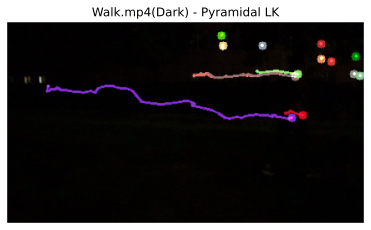

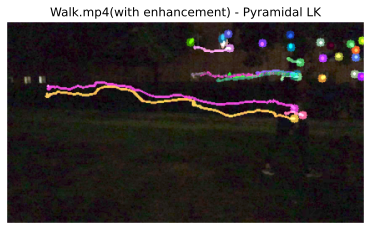

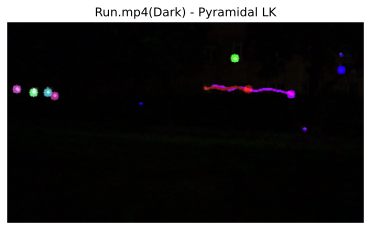

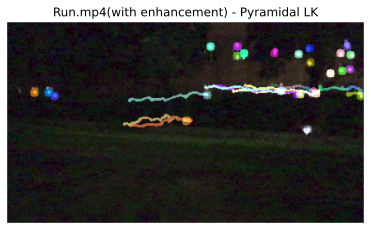

In [135]:
###############################################################################################
# Pyramidal Implementation of the Lucas Kanade Optical Flow
# Reference: Bouguet, J.Y., 2001. Pyramidal implementation of the affine lucas kanade feature tracker description of the algorithm. Intel corporation, 5(1-10), p.4.
# Website: http://robots.stanford.edu/cs223b04/algo_tracking.pdf

# Build image pyramid
def build_image_pyramid(image, levels=3, sigma=1):
    I = np.array(image, dtype=np.float32)
    s_0 = np.shape(I) # size of level 0

    # pyramid images and size for L levels
    pyramid = np.zeros((s_0[0],s_0[1],levels),dtype=np.float32) 
    s_L = np.zeros((levels,2),dtype=int)

    # First level is the original size
    pyramid[:,:,0] = I
    s_L[0,:] = s_0
    
    for i in range(1, levels):
        I = cv2.pyrDown(I)
        s_L[i,:] = I.shape
        pyramid[0:s_L[i,0],0:s_L[i,1],i]=I
    return pyramid, s_L


# Get index of points in the windows centered by q
def optimize_x_y(q,sh,l,wz):
    # window size
    wh = wz
    w = 2*wz+1

    # generate 2d array of points in the window size of x,y for all points
    range_y = [np.arange(val-wh, val+wh+1) for val in q[:,0]]
    range_x = [np.arange(val-wh, val+wh+1) for val in q[:,1]] # 以q的x为中心构建等差数列 x-w,...,x+w
    
    y = range_y
    x = range_x

    # limit the maximum value for x and y to the size of the current array -1
    # y = np.minimum(np.array(range_y),sh[l,0]-1)
    # x = np.minimum(np.array(range_x),sh[l,1]-1)

    # limit the minimum points to atleast 0
    # x[x<0] = 0
    # y[y<0] = 0

    # create different combinations of the window sized element to index, e.g for x [1 1 2 2 3 3] for y [1 2 3 1 2 3]
    # np.repeat 用于沿列重复 x，将窗口内的每行元素重复 w 次
	# np.tile 用于沿行重复 y，将每列元素重复 w 次，确保 x 和 y 是所有点坐标组合的二维数组
    x = np.repeat(x,w,axis=1) # x,y is 2D array, x dimension is diffrent x,y y dimension are different points
    y = np.tile(y,w)

    # shift x-1, y-1 
    x_ = x - 1
    y_ = y - 1
    #limit the minimum index
    # x_[x_<1] = 0
    # y_[y_<1] = 0

    return x,y, x_, y_

# Get derivative images Ix, Iy
def optimize_Ix_and_Iy(I_L,sh,l, x,y,x_,y_):
    # limit the maximum value
    y = y.astype(np.float32)
    x = x.astype(np.float32)
    y_ = y_.astype(np.float32)
    x_ = x_.astype(np.float32)

    # Subpixel computation, by 'cv2.remap'
    x_plus = x+1
    y_plus = y+1
    # x_plus = np.minimum(x + 1, (sh[l, 1] - 1))
    # y_plus = np.minimum(y + 1, (sh[l, 0] - 1))

    I_x_Shif_R = cv2.remap(I_L, x_plus, y, cv2.INTER_LINEAR)
    I_x_Shif_L = cv2.remap(I_L, x_,     y, cv2.INTER_LINEAR)

    I_y_Shif_D = cv2.remap(I_L, x, y_plus, cv2.INTER_LINEAR)
    I_y_Shif_U = cv2.remap(I_L, x, y_,     cv2.INTER_LINEAR) 
    
    I_x = (I_x_Shif_R-I_x_Shif_L)/2.0
    I_y = (I_y_Shif_D-I_y_Shif_U)/2.0
    
    return I_x, I_y

# Get image difference dIk
def optimized_dIk(I_L,J_L,x,y,v_k,g_L,l,sh):
    vy = (v_k[:,0]).reshape(len(v_k),1)
    vx = (v_k[:,1]).reshape(len(v_k),1)
    gy = (g_L[:,0]).reshape(len(g_L),1)
    gx = (g_L[:,1]).reshape(len(g_L),1)

    # 双线性内插法求 I_L[y,x], J_L[k,m]
    yy = y+vy+gy
    xx = x+vx+gx
    # yy[yy<1] = 0
    # xx[xx<1] = 0
    # yy[yy>(sh[l,0]-1)] = sh[l,0]-1
    # xx[xx>(sh[l,1]-1)] = sh[l,1]-1

    xx = xx.astype(np.float32)
    yy = yy.astype(np.float32)
    x = x.astype(np.float32)
    y = y.astype(np.float32)

    I = cv2.remap(I_L, x, y, cv2.INTER_LINEAR) 
    J = cv2.remap(J_L, xx, yy, cv2.INTER_LINEAR) 
    dI_k = I-J

    return dI_k


# select flow vector with reasonable length
def inlier(q2,d,S,inlier_threshold_d):
    # if q2+d falls outside of the image, then the feature "lost"
    v = q2+d
    within_img = ((v[:,0]>=0) & (v[:,1]>0) & (v[:,0]<S[0]) & (v[:,1]<S[1]))
    
    # if length of d is larger than threshold, then tracking failed
    d_norm = np.linalg.norm(d, axis=1) # length of d

    inlier_idx = np.where((d_norm<inlier_threshold_d)&(within_img == True))
    qr = q2[inlier_idx]
    dr = d[inlier_idx]

    return qr, dr


"""
# Parameters of lucas_pyramidal:
# features: points to track
# wz: The window size used in the optical flow algorithm
# level: The number of pyramid levels
# k: The number of iterations for each pyramid level
# inlier_threshold: The threshold for considering inliers during feature matching
"""
def lucas_pyramidal(img1_, img2_, features, wz=5, level=5, k=80, inlier_threshold=10, static=True):
    I1 = np.array(img1_)
    I2 = np.array(img2_)
    S = np.shape(I1)
    
    I_L,sh = build_image_pyramid(I1, levels=level, sigma=1)
    J_L,sh_J = build_image_pyramid(I2, levels=level, sigma=1)

    q2 = np.array(features).reshape(len(features),-1) # float型的keypoints输入
    
    # Initial guess for level Lm (the deepest level of pyramid) is set to zero
    g_Lm = np.zeros((len(q2),2),dtype=np.float32)
    v_k_out = [] # median value of v_k

    # calculate the optical flow for all points at a time for each level    
    for L in range(level-1,-1,-1):
        q = q2/(2.0**L)

        # convert the points to a 2d array of the points and their window size combinations for indexing
        x,y,x_,y_ = optimize_x_y(q,sh,L,wz)

        # Calculate the derivatives of the intensity I_L
        Ix,Iy = optimize_Ix_and_Iy(I_L[:,:,L],sh,L, x,y,x_,y_)    
        
        #form the spatial gradient matix of the points around x,y as an nx2x2
        Ixy = Ix*Iy 
        I2x = Ix*Ix
        I2y = Iy*Iy

        Ix_ = np.sum(I2x, axis=1)
        Iy_ = np.sum(I2y, axis=1)
        Ixy_ = np.sum(Ixy, axis=1)

        # G=「Ix*Ix  Ix*Iy
        #     Ix*Iy  Iy*Iy」
        a = np.dstack((Ix_,Ixy_,Ixy_,Iy_))
        G = a.reshape(len(Ix),2,2)
        G_ = np.linalg.pinv(G) # Pseudoinverse of G,每一层的G只要计算一次

        # the initial guess for the first iteration (k=0) is set to zero
        v_k = np.zeros((len(x),2),dtype=np.float32)
        delta_v_k = 1e-6

        for j in range(k):
            dIk = optimized_dIk(I_L[:,:,L],J_L[:,:,L],x,y,v_k,g_Lm,L,sh)
            # create the image mismatch vector b
            dIkx = dIk*Ix
            dIky = dIk*Iy
            dIkx = np.sum(dIkx, axis=1)
            dIky = np.sum(dIky, axis=1)
            b = np.dstack((dIkx,dIky)).reshape(len(Ix),2,1) # b是（x，y)的转置向量

            # optical flow LK
            n_k = np.matmul(G_,b)
            n_k = n_k.reshape(np.shape(v_k))
            n_k = n_k[:,::-1]         # np索引是行在前(y)，列在后(x)，所以v_k也将采用这种形式, n_k转成（y，x）形式!

            prev_v_k = v_k
            # guess for the next iteration
            v_k += n_k
            # print(f'第[{j}]次迭代 v_k[{j}]:{v_k}')

            #converges check
            diff = np.linalg.norm(v_k - prev_v_k, 2)
            if  diff < delta_v_k:
                # print("iteration number: ", j)
                break

        g_Lm = 2*(v_k+g_Lm)
        # print(f'第[{L}]层 g_Lm:{g_Lm[0,::]}')
        v_k_out.append(np.median(v_k,axis=0)) # 得到n个v_k的中位数, n是输入的key points的点数

    d = g_Lm/2
    # print(f'd:{d[0,::]}')

    q2, d = inlier(q2, d, S, inlier_threshold)
    q3 = q2 + d
    return q2, q3, d


##########################################################################################################
def compute_optical_flow_pyramid_LK(video_path, enhancement=0, max_corners=10, quality_level=0.01, min_distance=10):
    # Parameters for keypoint detection
    feature_params = dict(maxCorners=max_corners, qualityLevel=quality_level, minDistance=min_distance, blockSize=7)

    # Parameters for pyramidal implementation Lucas-Kanade optical flow
    tracking_params = dict(wz=4, level=3, k=70, inlier_threshold=20) #inlier_threshold is the maximum length limit of flow

    gamma = 0.5 # for enhancement

    min_points_threshold = 8 # Minimal number of keypoints
    last_q_num = 0; last_p_num = 0; tracking_ratio_threshold = 0.9 # Minimal tracking ratio

    enhance_title = "(Dark)"

    # Open video
    cap = cv2.VideoCapture(video_path)
    
    # Take the first frame and find corners in it
    ret, frame1 = cap.read()
    if not ret:
        print("Failed to capture video")
        cap.release()
        return
    
    # save the final result image
    save_fig = np.zeros_like(frame1, dtype=None, order='K', subok=True, shape=None)

    if(enhancement==1):
        # Enhancement applied to single frame
        frame1_enhance = enhanceSingleFrame(frame1, gamma)
        # Convert to grayscale
        prev_gray = cv2.cvtColor(frame1_enhance, cv2.COLOR_BGR2GRAY)
        enhance_title = "(with enhancement)"
    else:
        # Convert to grayscale
        prev_gray = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)

    # Detect key points in the first frame
    p0 = cv2.goodFeaturesToTrack(prev_gray, mask=None, **feature_params) # p0(x,y)
    p0 = p0[:, :, ::-1]  # (x,y) convert to (y, x)
    p0 = p0.reshape(-1, 2)
    
    # Create a mask image for drawing purposes
    mask = np.zeros_like(frame1)
    # Create some random colors
    color = np.random.randint(0, 255, (100, 3))

    while cap.isOpened():
        # Capture new frame
        ret, frame2 = cap.read()
        if not ret:
            break
        
        if(enhancement==1):
            # Enhancement applied to single frame
            frame2_enhance = enhanceSingleFrame(frame2, gamma)
            # Convert to grayscale
            gray = cv2.cvtColor(frame2_enhance, cv2.COLOR_BGR2GRAY)
        else:
            # Convert to grayscale
            gray = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

        # Check the number of key points, and if the number is insufficient, re-detect new key points
        if (len(p0) < min_points_threshold) or ((last_q_num<tracking_ratio_threshold*(last_p_num)) and last_p_num!=0):
            p0 = cv2.goodFeaturesToTrack(prev_gray, mask=None, **feature_params)
            p0 = p0[:, :, ::-1]
            p0 = p0.reshape(-1, 2)

        # record the tracking ratio
        last_p_num = len(p0)

        # Calculate optical flow using our Lucas-Kanade pyramidal implementation
        p0, p1, d = lucas_pyramidal(prev_gray, gray, p0, **tracking_params)
        last_q_num = len(p1)
        
        # Draw the tracks
        if(enhancement==1):
            show_img = frame2_enhance.copy() # show the enhancement result
        else:
            show_img = frame2.copy()

        if p1 is not None:

            # Draw an arrow from the original point to the new location
            for i, (new, old, dd) in enumerate(zip(p1, p0, d)):
                new = new[::-1]
                old = old[::-1]
                end_point = new.astype(int)
                start_point = old.astype(int)
                mask = cv2.line(mask, start_point, end_point, color[i].tolist(), 2)  
                show_img = cv2.circle(show_img, end_point, 5, color[i].tolist(), -1)

            output = cv2.add(show_img, mask)
            cv2.imshow(video_path + enhance_title + " - " + "Pyramidal LK", output)

            # Update the previous frame and the coordinates of the keypoint
            prev_gray = gray.copy()
            p0 = p1

            # update the figure
            save_fig = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)

        else:
            # If no points were tracked, reinitialize
            print(f'no points were tracked, reinitialize...')
            p0 = cv2.goodFeaturesToTrack(gray, mask=None, **feature_params)
            p0 = p0[:, :, ::-1]
            p0 = p0.reshape(-1, 2)

            prev_gray = gray.copy()

        # Exit if 'q' is pressed
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
        
    cap.release()
    cv2.destroyAllWindows()

    # show all the result in notebook
    plt.imshow(save_fig)
    plt.axis('off')
    plt.title(video_path + enhance_title + " - " + "Pyramidal LK")
    plt.show()

# Run the function on a sample video path
video_path = "Walk.mp4" 
compute_optical_flow_pyramid_LK(video_path, 0, 30, 0.01, 7)
compute_optical_flow_pyramid_LK(video_path, 1, 30, 0.01, 7)
video_path = "Run.mp4"
compute_optical_flow_pyramid_LK(video_path, 0, 30, 0.01, 7)
compute_optical_flow_pyramid_LK(video_path, 1, 30, 0.01, 7)

##### **Step 5: Apply `cv2.calcOpticalFlowPyrLK()` directly on Walk.mp4**

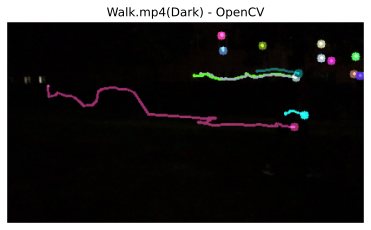

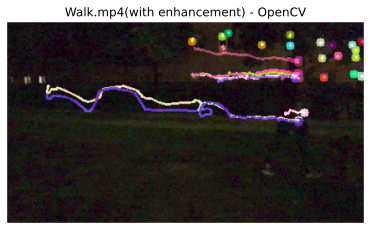

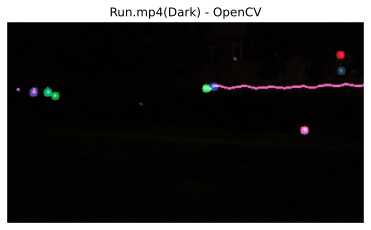

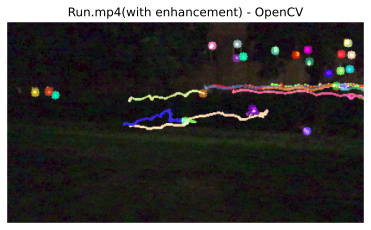

In [4]:
# OpenCV Version
#############################################################################
##                                                                         ##
##           TODO: CODE BLOCK FOR STEP 5 IS HERE                           ##
#############################################################################
def compute_optical_flow_OpenCV(video_path, enhancement=0, max_corners=10, quality_level=0.01, min_distance=10):
    # Parameters for keypoint detection
    feature_params = dict(maxCorners=max_corners, qualityLevel=quality_level, minDistance=min_distance, blockSize=7)
    
    # Parameters for Lucas-Kanade optical flow
    lk_params = dict(winSize=(15, 15), maxLevel=3, criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

    gamma = 0.5 # for enhancement

    min_points_threshold = 8 # Minimal number of keypoints
    last_q_num = 0; last_p_num = 0; tracking_ratio_threshold = 0.8 # Minimal tracking ratio

    enhance_title = "(Dark)"

    # Open video
    cap = cv2.VideoCapture(video_path)

    # Take the first frame and find corners in it
    ret, frame1 = cap.read()
    if not ret:
        print("Failed to capture video")
        cap.release()
        return
    
    # save the final result image
    save_fig = np.zeros_like(frame1, dtype=None, order='K', subok=True, shape=None)

    if(enhancement==1):
        # Enhancement applied to single frame
        frame1_enhance = enhanceSingleFrame(frame1, gamma)
        # Convert to grayscale
        prev_gray = cv2.cvtColor(frame1_enhance, cv2.COLOR_BGR2GRAY)
        enhance_title = "(with enhancement)"
    else:
        # Convert to grayscale
        prev_gray = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)

     # Detect key points in the first frame
    p0 = cv2.goodFeaturesToTrack(prev_gray, mask=None, **feature_params) # p0(x,y)
    
    # Create a mask image for drawing purposes
    mask = np.zeros_like(frame1)
    # Create some random colors
    color = np.random.randint(0, 255, (100, 3))

    while cap.isOpened():
        # Capture new frame
        ret, frame2 = cap.read()
        if not ret:
            break

        if(enhancement==1):
            # Enhancement applied to single frame
            frame2_enhance = enhanceSingleFrame(frame2, gamma)
            # Convert to grayscale
            gray = cv2.cvtColor(frame2_enhance, cv2.COLOR_BGR2GRAY)
        else:
            # Convert to grayscale
            gray = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

        # Check the number of key points, and if the number is insufficient, re-detect new key points
        if (len(p0) < min_points_threshold) or ((last_q_num<tracking_ratio_threshold*(last_p_num)) and last_p_num!=0):
            p0 = cv2.goodFeaturesToTrack(prev_gray, mask=None, **feature_params)

        # record the tracking ratio
        last_p_num = len(p0)

        # Calculate optical flow
        p1, st, err = cv2.calcOpticalFlowPyrLK(prev_gray, gray, p0, None, **lk_params)

        # Draw the tracks
        if(enhancement==1):
            show_img = frame2_enhance.copy() # show the enhancement result
        else:
            show_img = frame2.copy()

        # Select good points
        if p1 is not None:
            good_new = p1[st == 1]
            good_old = p0[st == 1]

            last_q_num = len(good_new)
            
            # Draw an arrow from the original point to the new location
            for i, (new, old) in enumerate(zip(good_new, good_old)):
                # if(np.linalg.norm(new-old)<1.0):
                #     continue
                a, b = new.ravel()
                c, d = old.ravel()
                mask = cv2.line(mask, (int(c), int(d)),(int(a), int(b)), color[i].tolist(), 2)  
                show_img = cv2.circle(show_img, (int(a), int(b)), 5, color[i].tolist(), -1)

            output = cv2.add(show_img, mask)
            cv2.imshow(video_path + enhance_title + " - " + "OpenCV", output)

            # Update the previous frame and the coordinates of the keypoint
            prev_gray = gray.copy()
            p0 = good_new.reshape(-1, 1, 2)

            # update the figure
            save_fig = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)

        else:
            last_q_num = 0

            # If no points were tracked, reinitialize
            p0 = cv2.goodFeaturesToTrack(gray, mask=None, **feature_params)
            prev_gray = gray.copy()

        # Exit if 'q' is pressed
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    
    cap.release()
    cv2.destroyAllWindows()

    # show all the result in notebook
    plt.imshow(save_fig)
    plt.axis('off')
    plt.title(video_path + enhance_title + " - " + "OpenCV")
    plt.show()


# Run the function on a sample video path
video_path = "Walk.mp4"
compute_optical_flow_OpenCV(video_path, 0, 30, 0.01, 7)
compute_optical_flow_OpenCV(video_path, 1, 30, 0.01, 7)

video_path = "Run.mp4"
compute_optical_flow_OpenCV(video_path, 0, 30, 0.01, 7)
compute_optical_flow_OpenCV(video_path, 1, 30, 0.01, 7)


[**Fill in your discussion to Step 5 here**]

<big>**Discussion on the key to estimate rather accurate optical flow:**</big><br>
Compared to the results of the normal LK method implementation in step 1, the results of `cv2.calcOpticalFlowPyrLK` are significantly improved. The reason, as its naming implies, is that it adopts the pyramid approach to LK implementation, whose advantages we have previously discussed and will not repeat here. Additionally, OpenCV likely performs better in filtering outlier points, achieving sub-pixel accuracy, and suppressing noise compared to my own implementation. The cv2.calcOpticalFlowPyrLK() function is optimized and highly refined, using well-tested internal parameters for pyramidal scales, window sizes, and termination criteria. Minor deviations in these settings could lead to differences between its results and those from a custom implementation.<br>

When comparing cv2.calcOpticalFlowPyrLK() to my own normal and pyramidal implementation of the LK approach, I believe that the two most crucial factors contributing to accurate optical flow estimation are the use of the pyramidal approach and iterative refinement.
